# Importing necessary libraries

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt   # used for plotting the graphs

# Generating 2-dimensional data with 2 classes

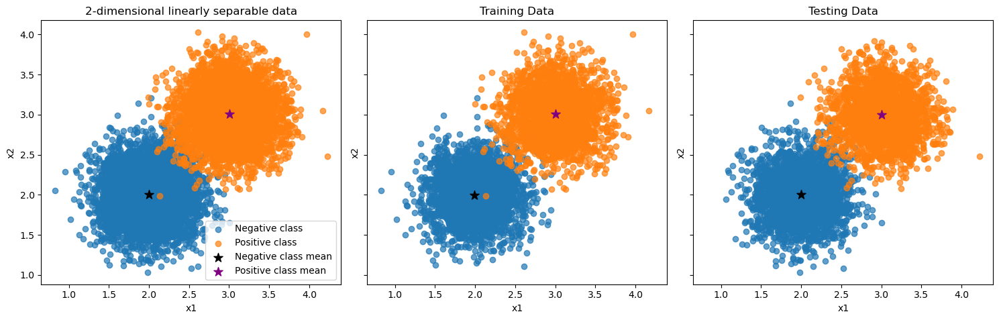

In [39]:
n = 10000    # number of samples
scaling_factor = 0.3
train_test_split = 0.5   # 50% into training
training_size = n*train_test_split   # training samples
classes = 2     # number of classes

# Class -1: Centered around (2, 2)
X0 = scaling_factor * np.random.randn(n//classes, classes) + [2, 2]
y0 = -1 * np.ones(n//classes, dtype=int)

# Class +1: Centered around (4, 4)
X1 = scaling_factor * np.random.randn(n//classes, classes) + [3, 3]
y1 = np.ones(n//classes, dtype=int)

# Combine
X = np.vstack((X0, X1))
y = np.hstack((y0, y1))

# Shuffle X and y together
indices = np.arange(len(y))
np.random.shuffle(indices)

X = X[indices]
y = y[indices]

X_train = X[:int(n*train_test_split), :]
X_test = X[int(n*train_test_split):, :]
y_train = y[:int(n*train_test_split)]
y_test = y[int(n*train_test_split):]

fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)

datasets = [
    (X, y, "2-dimensional linearly separable data"),
    (X_train, y_train, "Training Data"),
    (X_test, y_test, "Testing Data")
]

for ax, (X_d, y_d, title) in zip(axes, datasets):
    ax.scatter(X_d[y_d == -1][:, 0], X_d[y_d == -1][:, 1], alpha=0.7, label="Negative class")
    ax.scatter(X_d[y_d == 1][:, 0], X_d[y_d == 1][:, 1], alpha=0.7, label="Positive class")
    class_mean1 = np.mean(X_d[y_d == -1], axis=0)
    class_mean2 = np.mean(X_d[y_d == 1], axis=0)
    ax.scatter(*class_mean1, color='black', marker='*', s=100, label='Negative class mean')
    ax.scatter(*class_mean2, color='purple', marker='*', s=100, label='Positive class mean')
    ax.set_title(title)
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    ax.set_aspect('equal', adjustable='box')

axes[0].legend()
plt.tight_layout()
plt.show()

# Perceptron learning methods

In [40]:
# Stochastic learning
def perceptron_stochastic_history(X, y, lr=0.01, epochs=20, shuffle=False):
    n_samples, n_features = X.shape

    # Initializing weights and bias with small random numbers
    w = np.random.randn(n_features)
    b = np.random.randn()

    history = []   # store (w, b) per epoch

    for epoch in range(epochs):
        if shuffle:
            indices = np.random.permutation(n_samples)
            X_epoch = X[indices]
            y_epoch = y[indices]
        else:
            X_epoch = X
            y_epoch = y

        errors = 0

        for xi, yi in zip(X_epoch, y_epoch):
            if yi * (np.dot(w, xi) + b) <= 0:
                w += lr * yi * xi
                b += lr * yi
                errors += 1

        history.append((w.copy(), b))
        print(f"Epoch {epoch+1}, Misclassified: {errors}")

        if errors == 0:
            break

    return [w,b,history]

# Batch wise learning
def perceptron_batch_history(X, y, lr=0.01, epochs=20, shuffle=False):
    n_samples, n_features = X.shape

    w = np.random.randn(n_features)
    b = np.random.randn()

    history = []

    for epoch in range(epochs):
        if shuffle:
            indices = np.random.permutation(n_samples)
            X_epoch = X[indices]
            y_epoch = y[indices]
        else:
            X_epoch = X
            y_epoch = y

        errors = 0
        delta_w = np.zeros(n_features)
        delta_b = 0.0

        for xi, yi in zip(X_epoch, y_epoch):
            if yi * (np.dot(w, xi) + b) <= 0:
                delta_w += yi * xi
                delta_b += yi
                errors += 1

        # Batch update (single update per epoch)
        w += lr * delta_w
        b += lr * delta_b

        history.append((w.copy(), b))
        print(f"Epoch {epoch+1}, Misclassified: {errors}")

        if errors == 0:
            break

    return w, b, history


# Mini batch learning
# Helper
def perceptron_mini_batch_helper(X, y, w, b, lr):
    delta_w = np.zeros_like(w)
    delta_b = 0
    errors = 0

    for xi, yi in zip(X, y):
        if yi * (np.dot(w, xi) + b) <= 0:
            delta_w += yi * xi
            delta_b += yi
            errors += 1

    if errors > 0:
        w += lr * delta_w
        b += lr * delta_b

    return w, b, errors


# Mini batch learning
# Main
def perceptron_mini_batch_history(X, y, lr=0.01, epochs=20, k=5, shuffle=True):
    n_samples, n_features = X.shape
    fold_size = n_samples // k

    if k == 1:
        return perceptron_stochastic_history(X, y, lr, epochs)
    elif k == n_samples:
        return perceptron_batch_history(X, y, lr, epochs)
    w = np.random.randn(n_features)
    b = np.random.randn()

    history = []

    for epoch in range(epochs):

        # rotate validation MB
        val_mb_index = (k - 1 - epoch) % k

        if shuffle:
            idx = np.random.permutation(n_samples)
            X_epoch = X[idx]
            y_epoch = y[idx]
        else:
            X_epoch = X
            y_epoch = y

        
        errors = 0
        # ---- TRAINING ----
        for i in range(k):
            if i == val_mb_index:
                continue

            start = i * fold_size
            end = n_samples if i == k - 1 else (i + 1) * fold_size

            X_mb = X_epoch[start:end]
            y_mb = y_epoch[start:end]

            w, b, errors_helper = perceptron_mini_batch_helper(
                X_mb, y_mb, w, b, lr
            )
            errors += errors_helper
            history.append((w.copy(), b))

        print(f"\nEpoch {epoch+1} | Validation MB-{val_mb_index+1} | Misclassified: {errors}")
        # ---- VALIDATION ----
        start = val_mb_index * fold_size
        end = n_samples if val_mb_index == k - 1 else (val_mb_index + 1) * fold_size

        X_val = X_epoch[start:end]
        y_val = y_epoch[start:end]

        y_val_pred = np.sign(X_val @ w + b)
        val_acc = np.mean(y_val_pred == y_val)

        print(f"Validation Accuracy: {val_acc:.2f}")


    return w, b, history


def perceptron_predict(X, w, b):
    scores = X @ w + b
    return np.where(scores >= 0, 1, -1)

# Training the perceptron

Epoch 1, Misclassified: 315
Epoch 2, Misclassified: 148
Epoch 3, Misclassified: 141
Epoch 4, Misclassified: 137
Epoch 5, Misclassified: 126
Epoch 6, Misclassified: 120
Epoch 7, Misclassified: 115
Epoch 8, Misclassified: 112
Epoch 9, Misclassified: 113
Epoch 10, Misclassified: 94
Epoch 11, Misclassified: 96
Epoch 12, Misclassified: 94
Epoch 13, Misclassified: 102
Epoch 14, Misclassified: 98
Epoch 15, Misclassified: 98
Epoch 16, Misclassified: 98
Epoch 17, Misclassified: 87
Epoch 18, Misclassified: 96
Epoch 19, Misclassified: 85
Epoch 20, Misclassified: 85
Epoch 21, Misclassified: 85
Epoch 22, Misclassified: 100
Epoch 23, Misclassified: 87
Epoch 24, Misclassified: 89
Epoch 25, Misclassified: 94
Epoch 26, Misclassified: 89
Epoch 27, Misclassified: 93
Epoch 28, Misclassified: 94
Epoch 29, Misclassified: 87
Epoch 30, Misclassified: 93
Epoch 31, Misclassified: 90
Epoch 32, Misclassified: 87
Epoch 33, Misclassified: 85
Epoch 34, Misclassified: 85
Epoch 35, Misclassified: 78
Epoch 36, Misclass

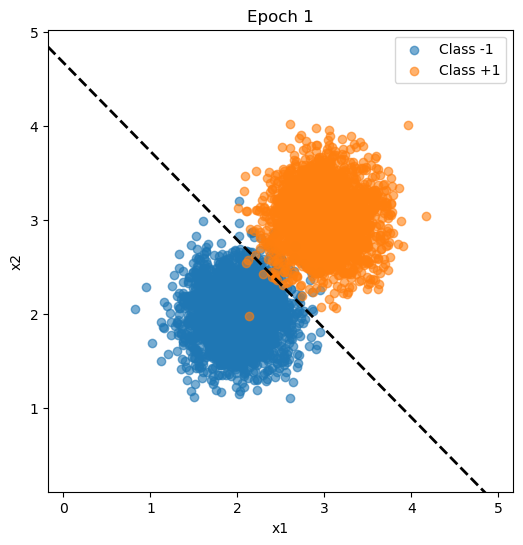

In [41]:
import matplotlib.animation as animation
from IPython.display import HTML

w_final, b_final, history = perceptron_stochastic_history(X_train, y_train, lr=0.01, epochs=100)
# w_final, b_final, history = perceptron_batch_history(X_train, y_train, lr=0.01, epochs=100)
# w_final, b_final, history = perceptron_mini_batch_history(X_train, y_train, lr=0.01, epochs=20, k=5)

fig, ax = plt.subplots(figsize=(6, 6))

# plot data once
ax.scatter(X_train[y_train == -1][:, 0], X_train[y_train == -1][:, 1],
           label="Class -1", alpha=0.6)
ax.scatter(X_train[y_train == 1][:, 0], X_train[y_train == 1][:, 1],
           label="Class +1", alpha=0.6)

ax.set_xlim(X_train[:,0].min()-1, X_train[:,0].max()+1)
ax.set_ylim(X_train[:,1].min()-1, X_train[:,1].max()+1)
ax.set_xlabel("x1")
ax.set_ylabel("x2")
ax.set_title("Perceptron Decision Boundary Evolution")
ax.legend()

# Calculating accuracy metrics
y_pred_test = perceptron_predict(X_test, w_final, b_final)

accuracy = np.mean(y_pred_test == y_test)

true_positives = np.sum((y_test == 1) & (y_pred_test == 1))
true_negatives = np.sum((y_test == -1) & (y_pred_test == -1))
false_positives = np.sum((y_test == -1) & (y_pred_test == 1))
false_negatives = np.sum((y_test == 1) & (y_pred_test == -1))

precision = (true_positives / (true_positives + false_positives)
             if (true_positives + false_positives) > 0 else 0)

recall = (true_positives / (true_positives + false_negatives)
          if (true_positives + false_negatives) > 0 else 0)

specificity = (true_negatives / (true_negatives + false_positives)
               if (true_negatives + false_positives) > 0 else 0)

f1_score = (((2*precision*recall)/(precision + recall)) if (precision + recall) > 0 else 0)

print("\nTest Accuracy:", f"{accuracy*100:.2f}%")
print("Precision:", f"{precision*100:.2f}%")
print("Recall/ Sensitivity:", f"{recall*100:.2f}%")
print("Specificity:", f"{specificity*100:.2f}%")
print("F1 score:", f"{f1_score*100:.2f}%")

line, = ax.plot([], [], 'k--', linewidth=2)

x_vals = np.linspace(X_train[:,0].min()-1, X_train[:,0].max()+1, 200)

def update(frame):
    w, b = history[frame]

    if w[1] != 0:
        y_vals = -(w[0] * x_vals + b) / w[1]
        line.set_data(x_vals, y_vals)

    ax.set_title(f"Epoch {frame+1}")
    return line,

ani = animation.FuncAnimation(
    fig, update, frames=len(history), interval=300, repeat=True
)

HTML(ani.to_jshtml())

# 2-dimensional data with n classes

In [42]:
def generate_multiclass_data(
    n_classes=4,
    samples_per_class=500,
    spread=0.3,
    centers=None,
    seed=42
):
    np.random.seed(seed)

    X_list, y_list = [], []

    if centers is None:
        centers = [(2*i, 2*i) for i in range(n_classes)]

    for c in range(n_classes):
        Xc = spread * np.random.randn(samples_per_class, 2) + centers[c]
        yc = np.full(samples_per_class, c)

        X_list.append(Xc)
        y_list.append(yc)

    X = np.vstack(X_list)
    y = np.hstack(y_list)

    idx = np.random.permutation(len(y))
    return X[idx], y[idx]

In [43]:
def perceptron_multiclass(
    X, y,
    lr=0.01,
    epochs=20,
    shuffle=True
):
    n_samples, n_features = X.shape
    n_classes = len(np.unique(y))

    W = np.random.randn(n_classes, n_features)
    b = np.random.randn(n_classes)

    history = []

    for epoch in range(epochs):
        if shuffle:
            idx = np.random.permutation(n_samples)
            X_epoch, y_epoch = X[idx], y[idx]
        else:
            X_epoch, y_epoch = X, y

        errors = 0

        for xi, yi in zip(X_epoch, y_epoch):
            # pick the class that gives the maximum W @ x + b
            scores = W @ xi + b
            y_pred = np.argmax(scores)

            # increasing the score of correct class, and decreasing the score of incorrect class
            if y_pred != yi:
                W[yi] += lr * xi
                b[yi] += lr
                W[y_pred] -= lr * xi
                b[y_pred] -= lr
                errors += 1

        history.append((W.copy(), b.copy()))
        print(f"Epoch {epoch+1}, Errors: {errors}")

        if errors == 0:
            break

    return W, b, history

def perceptron_multiclass_predict(X, W, b):
    scores = X @ W.T + b
    return np.argmax(scores, axis=1)


In [44]:
def plot_decision_regions(X, y, W, b, resolution=0.02):
    x_min, x_max = X[:,0].min()-1, X[:,0].max()+1
    y_min, y_max = X[:,1].min()-1, X[:,1].max()+1

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, resolution),
        np.arange(y_min, y_max, resolution)
    )

    grid = np.c_[xx.ravel(), yy.ravel()]
    preds = perceptron_multiclass_predict(grid, W, b)
    Z = preds.reshape(xx.shape)

    plt.contourf(xx, yy, Z, alpha=0.3)
    plt.scatter(X[:,0], X[:,1], c=y, edgecolor='k')
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.title("Multi-class Perceptron Decision Regions")
    plt.show()

In [45]:
# Generate data
X, y = generate_multiclass_data(
    n_classes=4,
    samples_per_class=500,
    spread=0.4
)

print("X shape:", X.shape)
print("y shape:", y.shape)
print("Classes:", np.unique(y))


W, b, history = perceptron_multiclass(
    X, y,
    lr=0.01,
    epochs=10,
    shuffle=True
)

y_pred = perceptron_multiclass_predict(X, W, b)
accuracy = np.mean(y_pred == y)

print(f"Final Training Accuracy: {accuracy*100:.2f}%")

X shape: (2000, 2)
y shape: (2000,)
Classes: [0 1 2 3]
Epoch 1, Errors: 753
Epoch 2, Errors: 127
Epoch 3, Errors: 195
Epoch 4, Errors: 80
Epoch 5, Errors: 68
Epoch 6, Errors: 46
Epoch 7, Errors: 78
Epoch 8, Errors: 46
Epoch 9, Errors: 34
Epoch 10, Errors: 34
Final Training Accuracy: 99.90%


# Multi-dimensional data with multiple classes

In [46]:
def generate_multiclass_data(n_samples=6000, n_features=30, n_classes=6):
    X = []
    y = []

    samples_per_class = n_samples // n_classes

    for c in range(n_classes):
        mean = np.zeros(n_features)
        mean[c] = 5      # separate classes along different dimensions
        Xc = np.random.randn(samples_per_class, n_features) + mean
        yc = np.full(samples_per_class, c)

        X.append(Xc)
        y.append(yc)

    X = np.vstack(X)
    y = np.hstack(y)

    idx = np.random.permutation(len(y))
    return X[idx], y[idx]

def train_test_split(X, y, test_ratio=0.2, shuffle=True):
    n = len(y)
    idx = np.arange(n)

    if shuffle:
        np.random.shuffle(idx)

    split = int(n * (1 - test_ratio))
    return X[idx[:split]], X[idx[split:]], y[idx[:split]], y[idx[split:]]

def perceptron_multiclass_stochastic(
    X, y, lr=0.01, epochs=50, shuffle=True
):
    n_samples, n_features = X.shape
    n_classes = len(np.unique(y))

    W = np.zeros((n_classes, n_features))
    b = np.zeros(n_classes)

    for epoch in range(epochs):
        if shuffle:
            idx = np.random.permutation(n_samples)
            X_epoch, y_epoch = X[idx], y[idx]
        else:
            X_epoch, y_epoch = X, y

        errors = 0

        for xi, yi in zip(X_epoch, y_epoch):
            scores = W @ xi + b
            y_pred = np.argmax(scores)

            if y_pred != yi:
                W[yi] += lr * xi
                b[yi] += lr
                W[y_pred] -= lr * xi
                b[y_pred] -= lr
                errors += 1

        print(f"Epoch {epoch+1}, Misclassified: {errors}")

        if errors == 0:
            print("Converged early!")
            break

    return W, b


def perceptron_multiclass_predict(X, W, b):
    #print((X @ W.T + b).shape)
    return np.argmax(X @ W.T + b, axis=1)


np.random.seed(0)

# Generate data
X, y = generate_multiclass_data(
    n_samples=10000,
    n_features=30,
    n_classes=10
)

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_ratio=0.5)

print("Train size:", X_train.shape)
print("Test size:", X_test.shape)

# Train
W, b = perceptron_multiclass_stochastic(
    X_train, y_train,
    lr=0.01,
    epochs=50
)

# Test
y_test_pred = perceptron_multiclass_predict(X_test, W, b)
accuracy = np.mean(y_test_pred == y_test)


print(f"\nTest Accuracy: {accuracy*100:.2f}%")

Train size: (5000, 30)
Test size: (5000, 30)
Epoch 1, Misclassified: 118
Epoch 2, Misclassified: 35
Epoch 3, Misclassified: 15
Epoch 4, Misclassified: 7
Epoch 5, Misclassified: 7
Epoch 6, Misclassified: 2
Epoch 7, Misclassified: 3
Epoch 8, Misclassified: 4
Epoch 9, Misclassified: 3
Epoch 10, Misclassified: 1
Epoch 11, Misclassified: 0
Converged early!

Test Accuracy: 99.42%


# Working with IRIS Dataset

In [47]:
import pandas as pd
df = pd.read_csv("./Iris.csv")
print(df.head())

   Id  SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm      Species
0   1            5.1           3.5            1.4           0.2  Iris-setosa
1   2            4.9           3.0            1.4           0.2  Iris-setosa
2   3            4.7           3.2            1.3           0.2  Iris-setosa
3   4            4.6           3.1            1.5           0.2  Iris-setosa
4   5            5.0           3.6            1.4           0.2  Iris-setosa


In [51]:
X = df.drop(columns=["Species", "Id"]).values
y_raw = df["Species"].values

# encoding
classes = np.unique(y_raw)
class_to_idx = {cls: i for i, cls in enumerate(classes)}

y = np.array([class_to_idx[label] for label in y_raw])

# standardization
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)

X = (X - X_mean) / X_std


def train_test_split(X, y, test_ratio=0.2, shuffle=True):
    n = len(y)
    idx = np.arange(n)

    if shuffle:
        np.random.shuffle(idx)

    split = int(n * (1 - test_ratio))
    return X[idx[:split]], X[idx[split:]], y[idx[:split]], y[idx[split:]]


X_train, X_test, y_train, y_test = train_test_split(X, y)


np.random.seed(0)

W, b = perceptron_multiclass_stochastic(
    X_train,
    y_train,
    lr=0.01,
    epochs=50
)

y_pred_test = perceptron_multiclass_predict(X_test, W, b)

accuracy = np.mean(y_pred_test == y_test)

print(f"\nTest Accuracy: {accuracy*100:.2f}%")

Epoch 1, Misclassified: 24
Epoch 2, Misclassified: 8
Epoch 3, Misclassified: 7
Epoch 4, Misclassified: 6
Epoch 5, Misclassified: 7
Epoch 6, Misclassified: 6
Epoch 7, Misclassified: 6
Epoch 8, Misclassified: 11
Epoch 9, Misclassified: 4
Epoch 10, Misclassified: 4
Epoch 11, Misclassified: 2
Epoch 12, Misclassified: 5
Epoch 13, Misclassified: 8
Epoch 14, Misclassified: 3
Epoch 15, Misclassified: 5
Epoch 16, Misclassified: 2
Epoch 17, Misclassified: 3
Epoch 18, Misclassified: 5
Epoch 19, Misclassified: 4
Epoch 20, Misclassified: 2
Epoch 21, Misclassified: 4
Epoch 22, Misclassified: 7
Epoch 23, Misclassified: 7
Epoch 24, Misclassified: 6
Epoch 25, Misclassified: 6
Epoch 26, Misclassified: 6
Epoch 27, Misclassified: 3
Epoch 28, Misclassified: 1
Epoch 29, Misclassified: 3
Epoch 30, Misclassified: 8
Epoch 31, Misclassified: 2
Epoch 32, Misclassified: 5
Epoch 33, Misclassified: 4
Epoch 34, Misclassified: 3
Epoch 35, Misclassified: 8
Epoch 36, Misclassified: 5
Epoch 37, Misclassified: 4
Epoch 38